In [11]:
!pip install matplotlib -q
!pip install opencv-python


[notice] A new release of pip is available: 24.2 -> 25.1.1
[notice] To update, run: python -m pip install --upgrade pip

[notice] A new release of pip is available: 24.2 -> 25.1.1
[notice] To update, run: python -m pip install --upgrade pip


In [12]:
import json
from pathlib import Path

import cv2
import matplotlib.patches as patches
import matplotlib.pyplot as plt

In [13]:
class BiryaniFrameVisualizer:
    """Visualize retrieved frames from biryani analysis pipeline."""

    def __init__(self, stage2_output_file):
        """Initialize with stage 2 output file."""
        with open(stage2_output_file) as f:
            self.data = json.load(f)

    def extract_frame(self, video_path, frame_number):
        """Extract a specific frame from video."""
        cap = cv2.VideoCapture(video_path)
        if not cap.isOpened():
            return None

        # Calculate target FPS (same as retriever)
        original_fps = cap.get(cv2.CAP_PROP_FPS)
        if original_fps <= 0:
            original_fps = 30
        target_fps = 4
        frame_skip = max(1, int(round(original_fps / target_fps)))

        # Jump to target frame in extracted sequence
        target_video_frame = frame_number * frame_skip
        cap.set(cv2.CAP_PROP_POS_FRAMES, target_video_frame)

        ret, frame = cap.read()
        cap.release()

        if ret:
            return cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        return None

    def visualize_action_class(self, action_class, max_clips=5, figsize=(20, 15)):
        """Visualize frames for a specific action class."""
        if action_class not in self.data:
            print(f"Action class '{action_class}' not found in data")
            return

        action_data = self.data[action_class]
        clips = action_data.get("Clips", {})
        proposed_differences = action_data.get("proposed_differences", {})

        # Limit number of clips to display
        clip_items = list(clips.items())[:max_clips]

        print(f"🍚 Visualizing Action Class: {action_class}")
        print(f"📹 Processing {len(clip_items)} clips")
        print(f"🔍 Found {len(proposed_differences)} proposed differences")

        for clip_id, clip_data in clip_items:
            self._visualize_clip(clip_id, clip_data, proposed_differences, figsize)

    def _visualize_clip(self, clip_id, clip_data, proposed_differences, figsize):
        """Visualize frames for a single clip."""
        video_path = clip_data["url"]
        biryani_type = clip_data.get("type", "unknown")
        retrieval_frames = clip_data.get("retrival_frames", {})

        if not retrieval_frames:
            print(f"⚠️  No retrieved frames for clip {clip_id}")
            return

        print(f"\n📽️  Clip {clip_id}: {biryani_type}")
        print(f"    Video: {video_path}")

        # Count total frames to display
        total_frames = sum(
            len(frames) for frames in retrieval_frames.values() if frames
        )
        if total_frames == 0:
            print("    No frames retrieved")
            return

        # Create subplot grid
        n_differences = len(
            [diff for diff, frames in retrieval_frames.items() if frames]
        )
        cols = min(3, max(2, n_differences))
        rows = max(2, (total_frames + cols - 1) // cols)

        fig, axes = plt.subplots(rows, cols, figsize=figsize)
        if rows == 1:
            axes = axes.reshape(1, -1) if cols > 1 else [axes]
        elif cols == 1:
            axes = axes.reshape(-1, 1)

        # Flatten axes for easier indexing
        axes_flat = axes.flatten()
        plot_idx = 0

        # Display frames for each difference
        for diff_name, frame_indices in retrieval_frames.items():
            if not frame_indices:
                continue

            # Get difference details
            diff_details = None
            for diff_data in proposed_differences.values():
                if diff_data["name"] == diff_name:
                    diff_details = diff_data
                    break

            description = (
                diff_details.get("description", "No description")
                if diff_details
                else "No description"
            )

            print(f"    🎯 {diff_name}: frames {frame_indices}")

            # Display each frame for this difference
            for frame_idx in frame_indices:
                if plot_idx >= len(axes_flat):
                    break

                ax = axes_flat[plot_idx]

                # Extract and display frame
                frame = self.extract_frame(video_path, frame_idx)
                if frame is not None:
                    ax.imshow(frame)

                    # Add title with difference name and frame number
                    title = f"{diff_name}\nFrame {frame_idx}"
                    ax.set_title(title, fontsize=10, fontweight="bold", pad=10)

                    # Add colored border based on biryani type
                    colors = {
                        "hyderabadi_biryani": "red",
                        "lucknow_awadhi_biryani": "blue",
                        "dindigul_biryani": "green",
                        "sindhi_biryani": "orange",
                        "kashmiri_biryani": "purple",
                    }
                    border_color = colors.get(biryani_type, "black")

                    # Add rectangle border
                    rect = patches.Rectangle(
                        (0, 0),
                        frame.shape[1] - 1,
                        frame.shape[0] - 1,
                        linewidth=4,
                        edgecolor=border_color,
                        facecolor="none",
                    )
                    ax.add_patch(rect)

                else:
                    ax.text(
                        0.5,
                        0.5,
                        f"Frame {frame_idx}\nNot Available",
                        ha="center",
                        va="center",
                        fontsize=12,
                    )
                    ax.set_title(
                        f"{diff_name}\nFrame {frame_idx} (Error)",
                        fontsize=10,
                        color="red",
                    )

                ax.axis("off")
                plot_idx += 1

        # Hide unused subplots
        for idx in range(plot_idx, len(axes_flat)):
            axes_flat[idx].axis("off")

        # Add overall title
        fig.suptitle(
            f"Clip {clip_id}: {biryani_type.replace('_', ' ').title()}\n{video_path}",
            fontsize=14,
            fontweight="bold",
            y=0.98,
        )

        plt.tight_layout()
        plt.subplots_adjust(top=0.92)
        plt.show()

    def visualize_all_actions(self, max_clips_per_action=3):
        """Visualize frames for all action classes."""
        for action_class in self.data.keys():
            self.visualize_action_class(action_class, max_clips=max_clips_per_action)
            print("\n" + "=" * 80 + "\n")

    def create_summary_report(self):
        """Create a summary report of retrieved frames."""
        print("📊 BIRYANI FRAME RETRIEVAL SUMMARY REPORT")
        print("=" * 60)

        total_clips = 0
        total_differences = 0
        total_frames_retrieved = 0

        for action_class, action_data in self.data.items():
            clips = action_data.get("Clips", {})
            differences = action_data.get("proposed_differences", {})

            print(f"\n🎬 Action Class: {action_class}")
            print(f"   📹 Clips: {len(clips)}")
            print(f"   🔍 Proposed Differences: {len(differences)}")

            action_frames = 0
            for clip_id, clip_data in clips.items():
                retrieval_frames = clip_data.get("retrival_frames", {})
                clip_frames = sum(
                    len(frames) for frames in retrieval_frames.values() if frames
                )
                action_frames += clip_frames
                print(
                    f"      Clip {clip_id} ({clip_data.get('type', 'unknown')}): {clip_frames} frames"
                )

            print(f"   📊 Total Frames Retrieved: {action_frames}")

            total_clips += len(clips)
            total_differences += len(differences)
            total_frames_retrieved += action_frames

        print(f"\n{'=' * 60}")
        print("📈 OVERALL SUMMARY:")
        print(f"   Total Action Classes: {len(self.data)}")
        print(f"   Total Clips: {total_clips}")
        print(f"   Total Proposed Differences: {total_differences}")
        print(f"   Total Frames Retrieved: {total_frames_retrieved}")
        print(f"   Average Frames per Clip: {total_frames_retrieved / total_clips:.1f}")

In [20]:
# Example usage and main visualization code
def main():
    """Main function to run the visualization."""

    # Configuration
    STAGE2_OUTPUT_FILE = "gemini_stage_2.json"

    # Check if file exists
    if not Path(STAGE2_OUTPUT_FILE).exists():
        print(f"❌ Error: Stage 2 output file '{STAGE2_OUTPUT_FILE}' not found!")
        print("Please run Stage 2 first using:")
        print(
            f"python run_stage.py --stage 2 --input sampled_local_stage_1.json --output {STAGE2_OUTPUT_FILE}"
        )
        return

    # Initialize visualizer
    print("🎨 Initializing Biryani Frame Visualizer...")
    visualizer = BiryaniFrameVisualizer(STAGE2_OUTPUT_FILE)

    # Create summary report
    visualizer.create_summary_report()

    print("\n" + "🖼️ " + "=" * 58 + " 🖼️")
    print("                    FRAME VISUALIZATIONS")
    print("🖼️ " + "=" * 58 + " 🖼️\n")

    # Visualize all action classes
    visualizer.visualize_all_actions(max_clips_per_action=3)

    print("✅ Visualization complete!")

📚 Biryani Frame Visualization Notebook
To use this notebook:
1. Run Stage 2: python run_stage.py --stage 2 --input sampled_local_stage_1.json --output sampled_local_stage_2.json
2. Then call: main() to see all visualizations
3. Or create visualizer: visualizer = BiryaniFrameVisualizer('sampled_local_stage_2.json')
4. Then use: visualizer.visualize_action_class('adding cardamom pods to the pot')
🎨 Initializing Biryani Frame Visualizer...
📊 BIRYANI FRAME RETRIEVAL SUMMARY REPORT

🎬 Action Class: covering the dish with a lid
   📹 Clips: 2
   🔍 Proposed Differences: 5
      Clip 1 (lucknow_awadhi_biryani): 10 frames
      Clip 2 (lucknow_awadhi_biryani): 10 frames
   📊 Total Frames Retrieved: 20

🎬 Action Class: placing fried onions back into the pot
   📹 Clips: 2
   🔍 Proposed Differences: 5
      Clip 1 (sindhi_biryani): 10 frames
      Clip 2 (kashmiri_biryani): 10 frames
   📊 Total Frames Retrieved: 20

📈 OVERALL SUMMARY:
   Total Action Classes: 2
   Total Clips: 4
   Total Proposed D

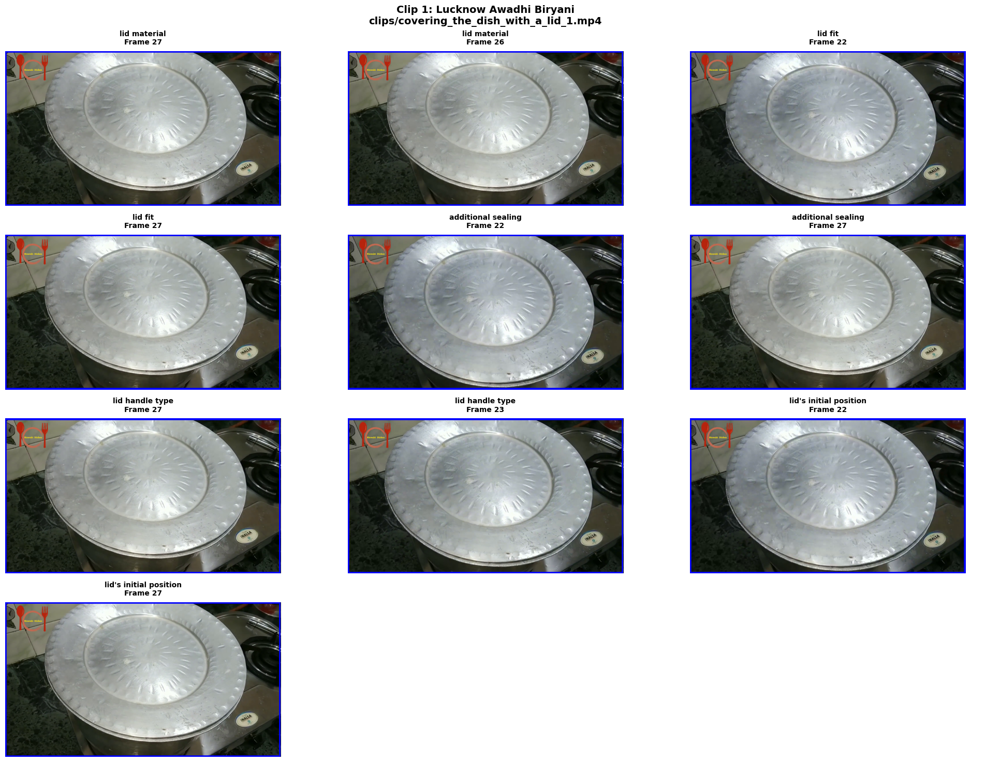


📽️  Clip 2: lucknow_awadhi_biryani
    Video: clips/covering_the_dish_with_a_lid_2.mp4
    🎯 lid material: frames [39, 38]
    🎯 lid fit: frames [39, 38]
    🎯 additional sealing: frames [39, 38]
    🎯 lid handle type: frames [39, 38]
    🎯 lid's initial position: frames [39, 38]


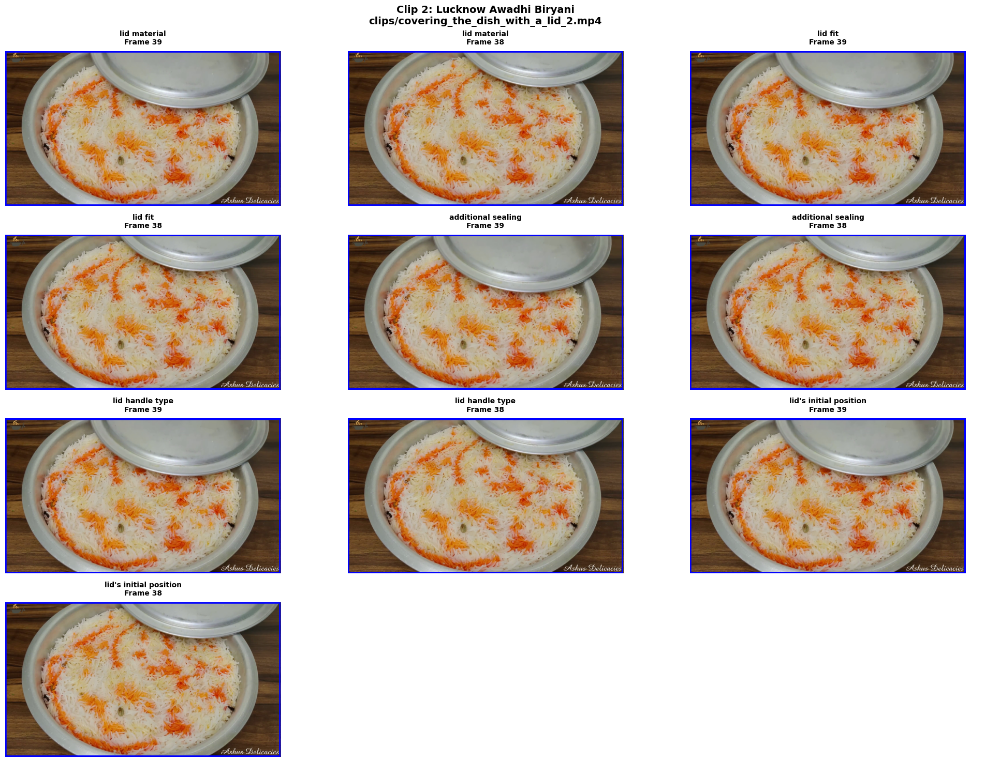



🍚 Visualizing Action Class: placing fried onions back into the pot
📹 Processing 2 clips
🔍 Found 5 proposed differences

📽️  Clip 1: sindhi_biryani
    Video: clips/placing_fried_onions_back_into_the_pot_1.mp4
    🎯 Quantity of Onions: frames [12, 11]
    🎯 Onion Color/Crispness: frames [12, 17]
    🎯 Distribution of Onions: frames [12, 31]
    🎯 Residual Oil on Onions: frames [12, 37]
    🎯 Presence of Other Ingredients: frames [12, 35]


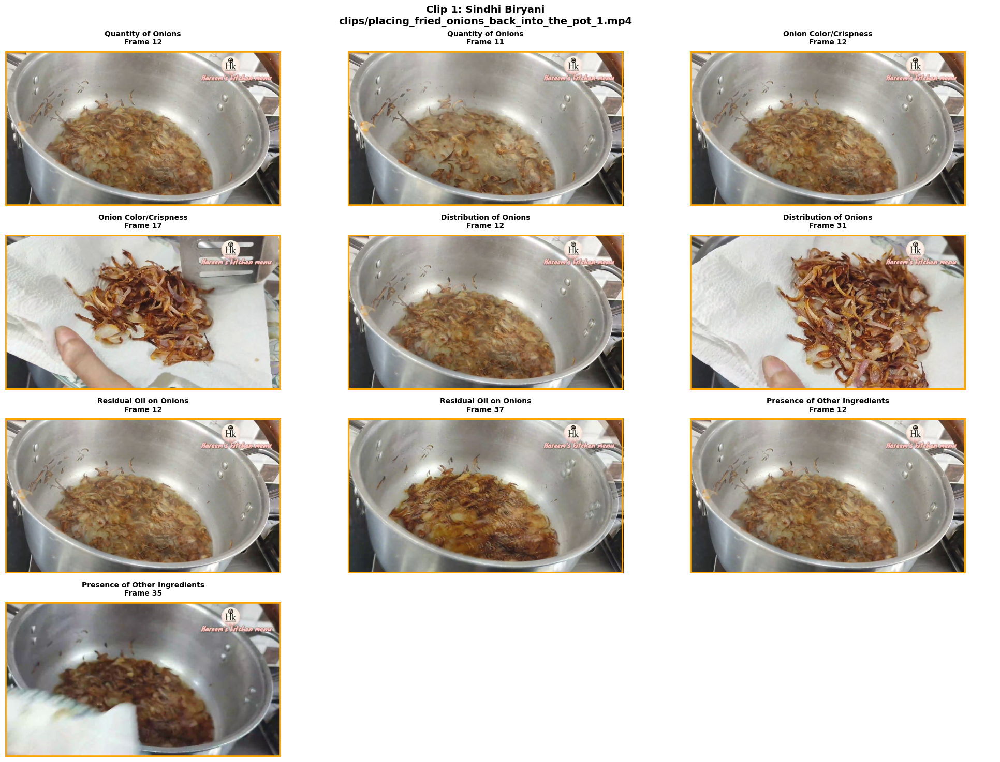


📽️  Clip 2: kashmiri_biryani
    Video: clips/placing_fried_onions_back_into_the_pot_2.mp4
    🎯 Quantity of Onions: frames [36, 37]
    🎯 Onion Color/Crispness: frames [37, 41]
    🎯 Distribution of Onions: frames [36, 39]
    🎯 Residual Oil on Onions: frames [36, 37]
    🎯 Presence of Other Ingredients: frames [35, 41]


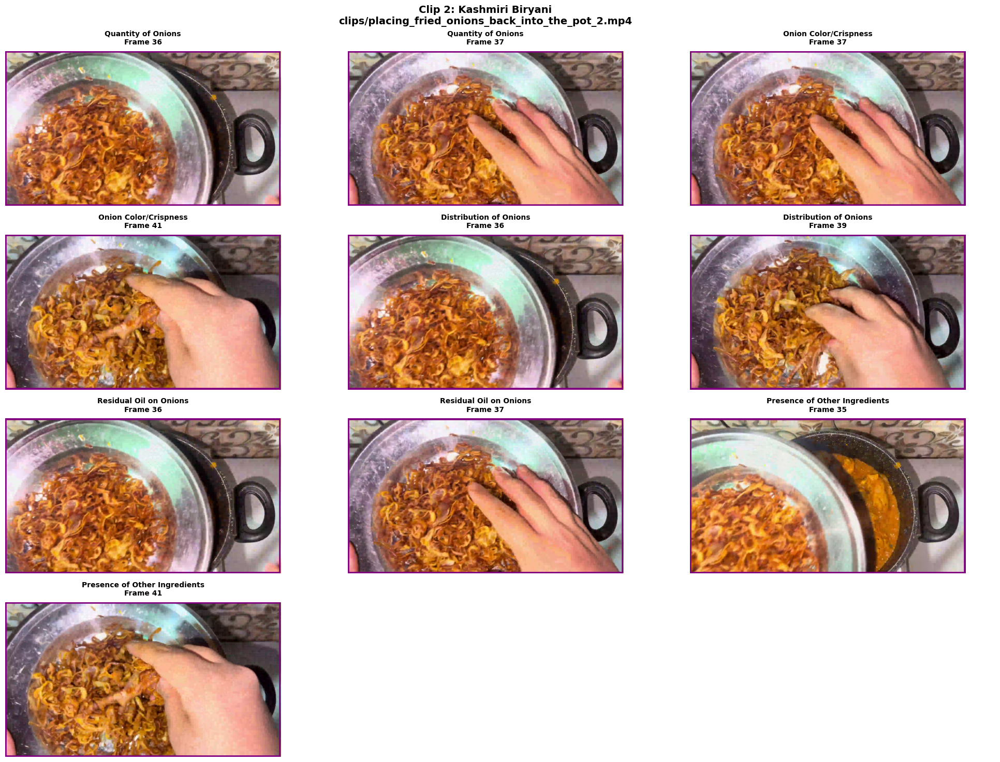



✅ Visualization complete!


In [21]:
if __name__ == "__main__":
    # For Jupyter notebook usage
    print("📚 Biryani Frame Visualization Notebook")
    print("To use this notebook:")
    print(
        "1. Run Stage 2: python run_stage.py --stage 2 --input sampled_local_stage_1.json --output sampled_local_stage_2.json"
    )
    print("2. Then call: main() to see all visualizations")
    print(
        "3. Or create visualizer: visualizer = BiryaniFrameVisualizer('sampled_local_stage_2.json')"
    )
    print(
        "4. Then use: visualizer.visualize_action_class('adding cardamom pods to the pot')"
    )
    main()